In [44]:
from os import listdir
from cv2 import imread, cvtColor, COLOR_BGR2RGB, calcHist
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
imgs_folder_name = 'rawdata'

def getImgNamesAndPaths(imgs_folder_name):

    # Lista de nombres de imágenes
    list_img_names = listdir(imgs_folder_name)
    
    # Lista de path de cada imagen
    list_paths_to_img = []
    for img_name in list_img_names:
        img_path = imgs_folder_name + '/' + img_name
        list_paths_to_img.append(img_path)

    # Creación de diccionario - nombre_img:path_img
    dictionary = dict()
    for i in range(len(list_img_names)):
        dictionary[list_img_names[i]] = list_paths_to_img[i]

    return dictionary

dictionary = getImgNamesAndPaths(imgs_folder_name)

print(dictionary)

{'frb-001.jpg': 'rawdata/frb-001.jpg', 'frb-002.jpg': 'rawdata/frb-002.jpg', 'frb-003.jpg': 'rawdata/frb-003.jpg', 'frb-004.jpg': 'rawdata/frb-004.jpg', 'frb-005.jpg': 'rawdata/frb-005.jpg'}


In [3]:
list_paths_to_img = [*dictionary.values()]
print(list_paths_to_img)

['rawdata/frb-001.jpg', 'rawdata/frb-002.jpg', 'rawdata/frb-003.jpg', 'rawdata/frb-004.jpg', 'rawdata/frb-005.jpg']


In [7]:
def getImagesFromPathfile(list_pathfile, mode=COLOR_BGR2RGB):
    list_imgs = []
    for i in range(len(list_pathfile)):
        img = cvtColor( imread(list_pathfile[i]) , mode)
        list_imgs.append(img)

    return list_imgs

list_imgs = getImagesFromPathfile(list_paths_to_img)

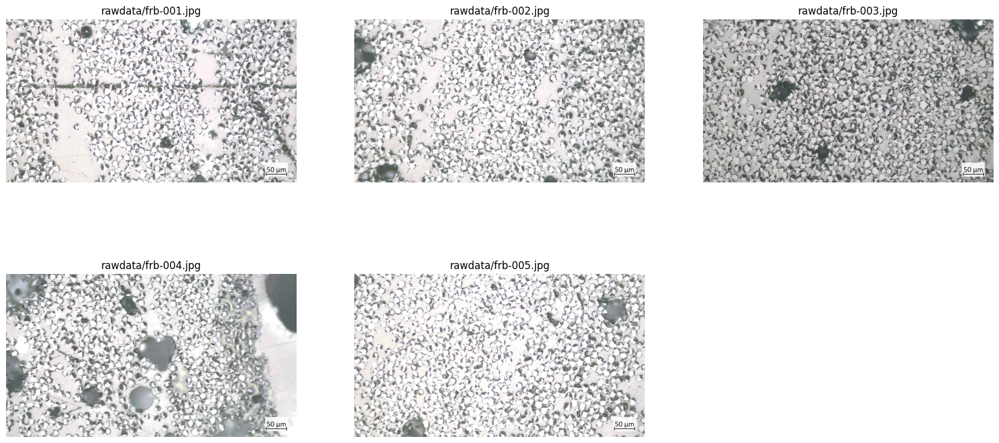

In [8]:
def plotImgs(list_names, list_imgs):
    nrows = len(list_names) // 3 + 1
    ncols = 3

    fig = plt.figure(figsize=(21, int(5*nrows)))

    for i in range(len(list_names)):
        ax = fig.add_subplot(nrows, ncols, i + 1)
        ax.imshow(list_imgs[i])
        ax.set_title(list_names[i])
        ax.axis('off')

    plt.show()

plotImgs(list_paths_to_img,list_imgs)

0 255


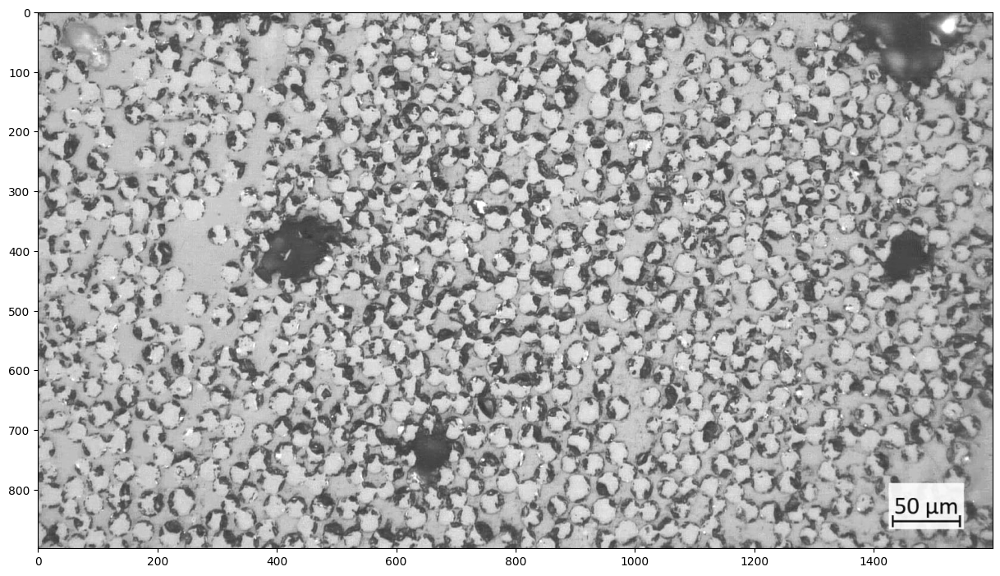

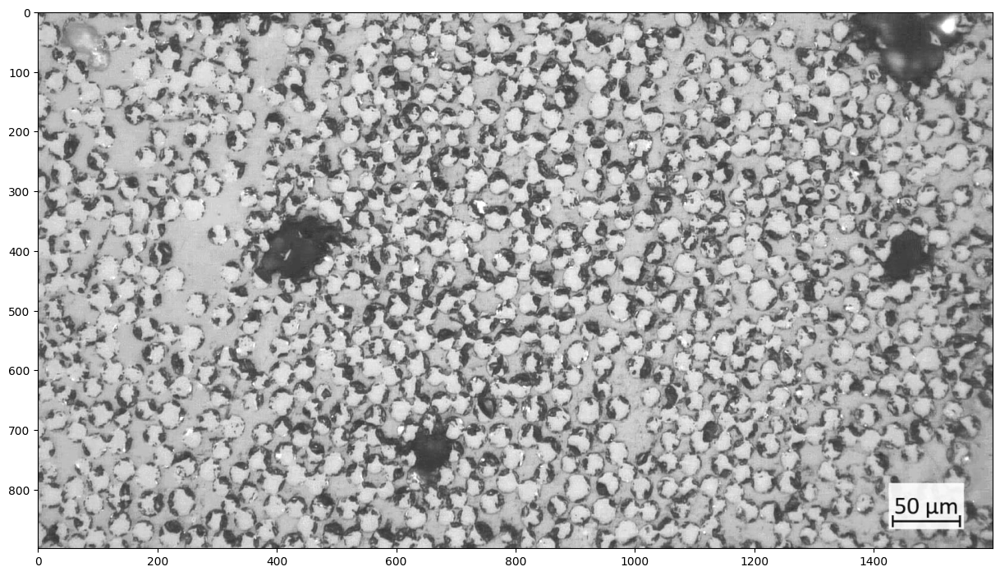

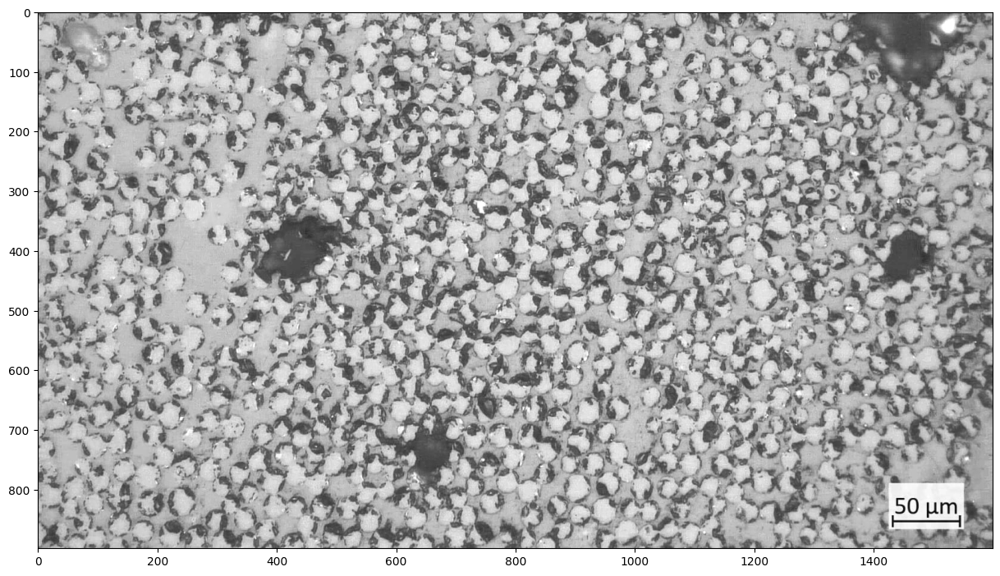

In [9]:
img_sample = list_imgs[2]

img_rch = img_sample[:,:,0]
img_gch = img_sample[:,:,1]
img_bch = img_sample[:,:,2]

print(np.min(img_rch),np.max(img_rch))

fig = plt.figure(figsize=(15,15))
plt.imshow(img_gch,cmap='gray',vmin=0,vmax=255)
plt.show()

fig = plt.figure(figsize=(15,15))
plt.imshow(img_rch,cmap='gray',vmin=0,vmax=255)
plt.show()

fig = plt.figure(figsize=(15,15))
plt.imshow(img_bch,cmap='gray',vmin=0,vmax=255)
plt.show()

1437501
1437501.0


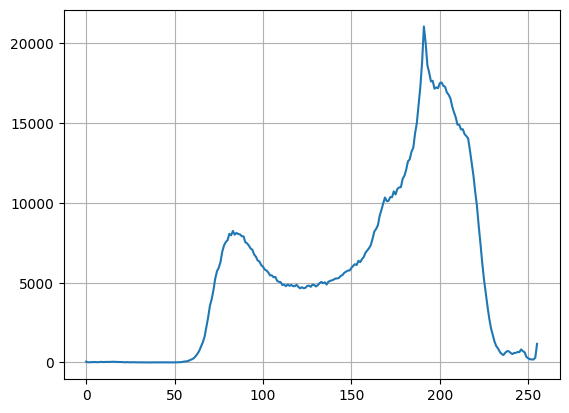

In [21]:
print(np.shape(img_gch)[0]*np.shape(img_gch)[1])

# compute a grayscale histogram
hist = calcHist([img_gch], [0], None, [256], [0, 256])

print(hist.sum())

plt.plot(hist)
plt.grid()
plt.show()

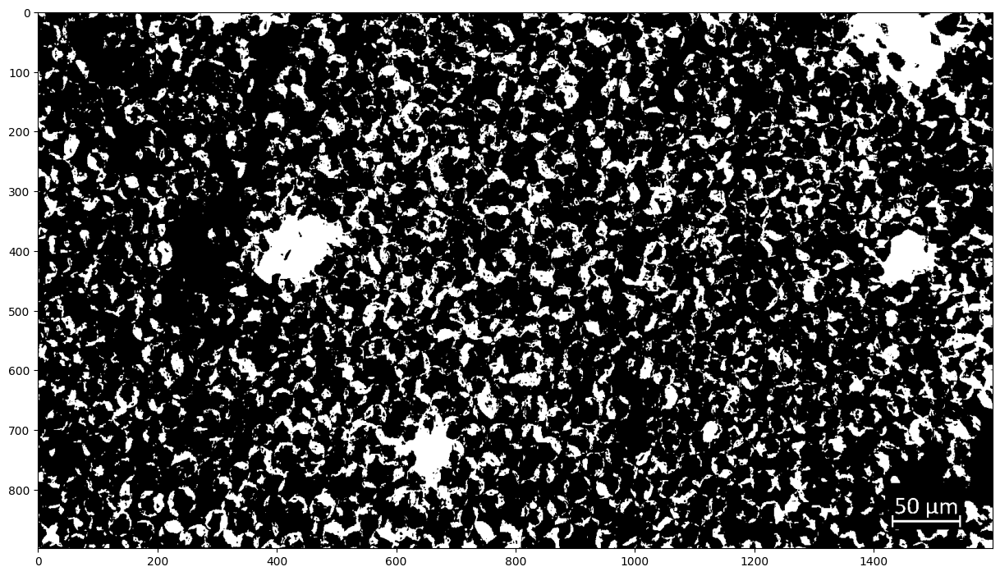

In [58]:
img_bch_copy = img_bch.copy()

img_bch_copy[img_bch < 120] = 255

img_bch_copy[(img_bch >= 120) & (img_bch < 200)] = 0

#img_bch_copy[img_bch_copy != 0] = 255

img_bch_copy[img_bch >= 200] = 0

fig = plt.figure(figsize=(15,15))
plt.imshow(img_bch_copy,cmap='gray')
plt.show()

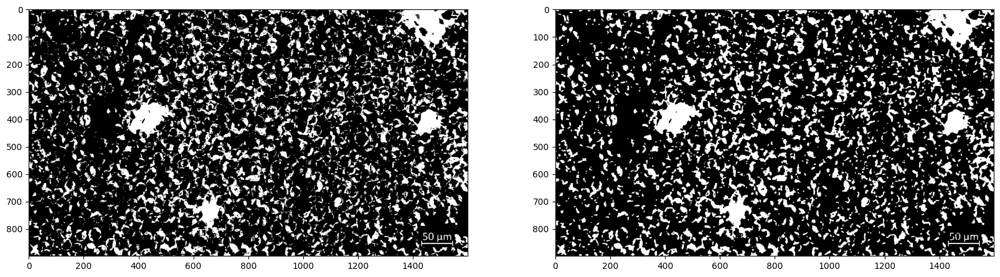

In [72]:
kernel_cl = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
closing = cv2.morphologyEx(img_bch_copy, cv2.MORPH_CLOSE, kernel_cl)

kernel_op = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel_op)

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(img_bch_copy,cmap='gray')

ax = fig.add_subplot(1, 2, 2)
plt.imshow(opening,cmap='gray')


plt.show()

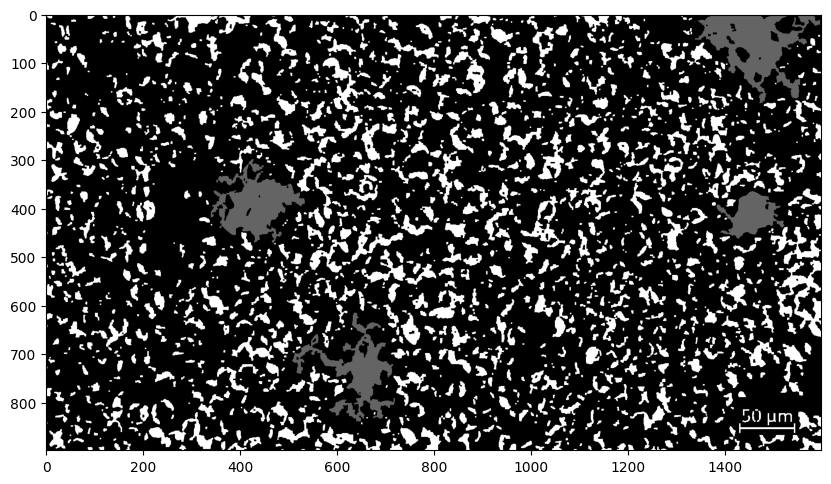

In [74]:
from skimage.segmentation import flood

coordinates = [(400,410),(750,650),(400,1450),(50,1480)]

image_flooded = opening.copy()
list_masks = []

for coordinate in coordinates:
    mask = flood(opening, coordinate, tolerance=1)
    list_masks.append(mask)
    image_flooded[mask] = 100

fig = plt.figure(figsize=(10,10))
plt.imshow(image_flooded,cmap='gray')
plt.show()

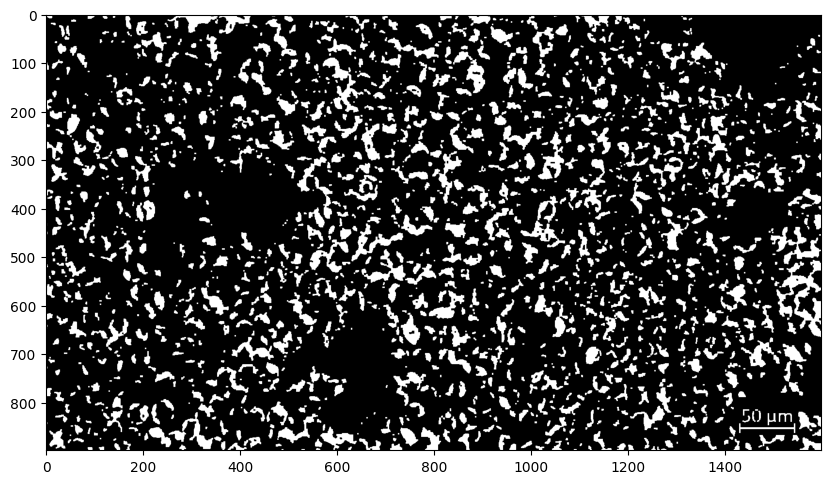

In [75]:
image_with_no_bubbles = opening.copy()

for mask in list_masks:
    image_with_no_bubbles[mask] = 0

fig = plt.figure(figsize=(10,10))
plt.imshow(image_with_no_bubbles,cmap='gray')
plt.show()

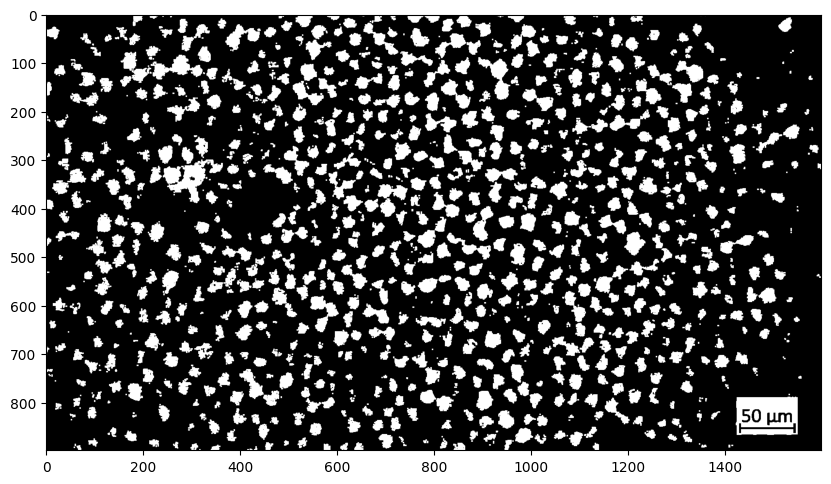

In [78]:
img_with_only_fibers = img_bch.copy()

img_with_only_fibers[img_bch < 200] = 0
img_with_only_fibers[img_bch >= 200] = 255

opening_2 = cv2.morphologyEx(img_with_only_fibers, cv2.MORPH_OPEN, kernel_op)

fig = plt.figure(figsize=(10,10))
plt.imshow(opening_2,cmap='gray')
plt.show()

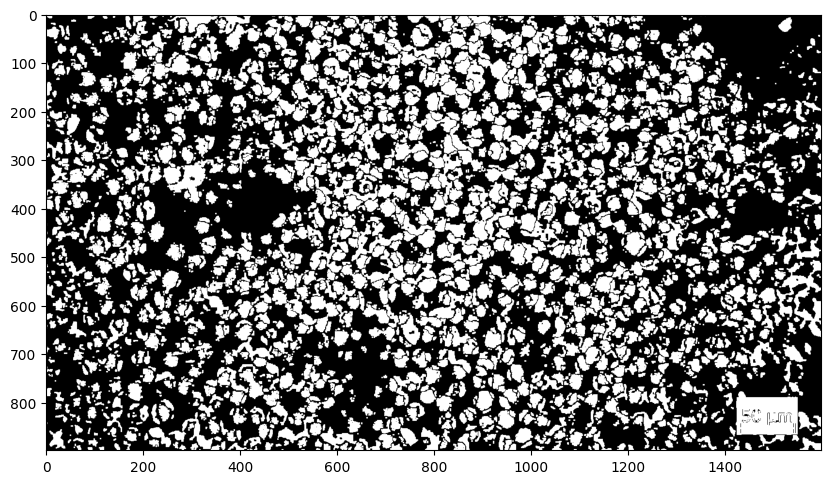

In [79]:
img_with_complete_fibers = image_with_no_bubbles + opening_2
img_with_complete_fibers[img_with_complete_fibers>255] = 255

fig = plt.figure(figsize=(10,10))
plt.imshow(img_with_complete_fibers,cmap='gray')
plt.show()

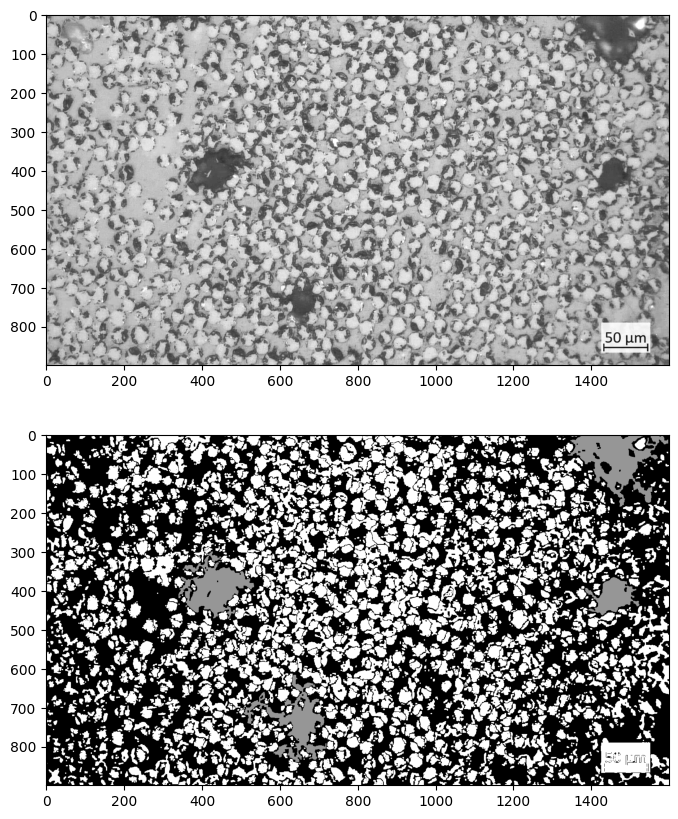

In [84]:
img_with_segmentation = img_with_complete_fibers.copy()

for mask in list_masks:
    img_with_segmentation[mask] = 150

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(2, 1, 1)
plt.imshow(img_bch,cmap='gray')

ax = fig.add_subplot(2, 1, 2)
plt.imshow(img_with_segmentation,cmap='gray')

plt.show()

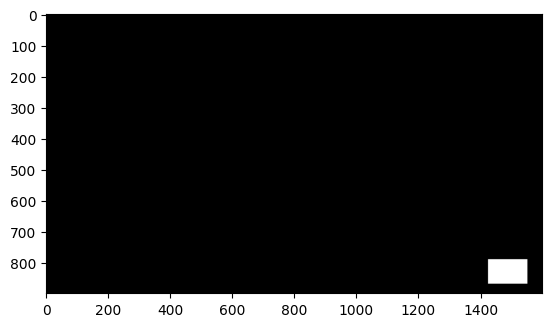

In [87]:
mascara_etiqueta = np.zeros(np.shape(img_bch))
mascara_etiqueta[790:869,1425:1552] = 255

plt.imshow(mascara_etiqueta,cmap='gray')
plt.show()

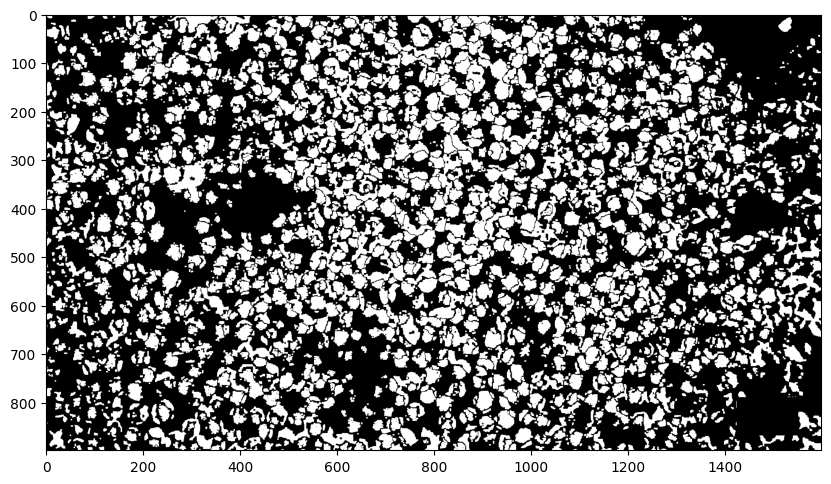

0 255


In [113]:
img_with_complete_fibers_no_label = img_with_complete_fibers.copy()

img_with_complete_fibers_no_label[mascara_etiqueta == 255] = 0

fig = plt.figure(figsize=(10,10))
plt.imshow(img_with_complete_fibers_no_label,cmap='gray')
plt.show()

print(np.min(img_with_complete_fibers_no_label),np.max(img_with_complete_fibers_no_label))

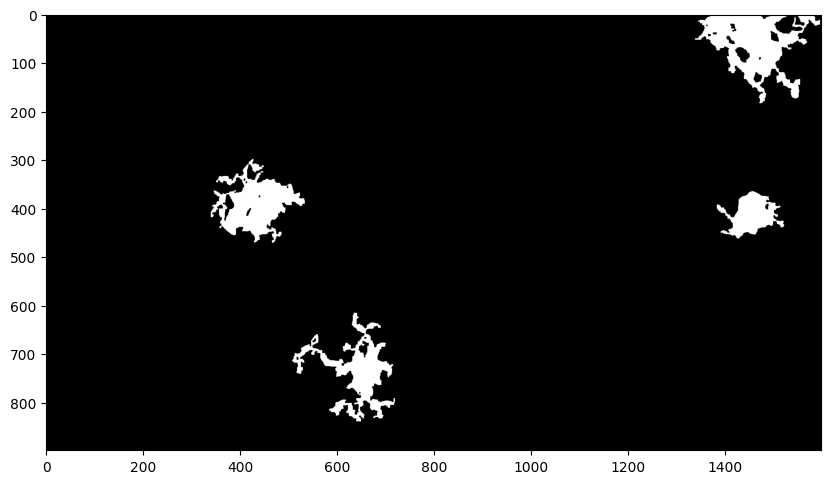

0 255


In [114]:
img_with_complete_bubbles_no_label = np.zeros(np.shape(img_bch))

for mask in list_masks:
    img_with_complete_bubbles_no_label[mask] = 255

img_with_complete_bubbles_no_label[mascara_etiqueta == 255] = 0

img_with_complete_bubbles_no_label = np.uint8(img_with_complete_bubbles_no_label)

fig = plt.figure(figsize=(10,10))
plt.imshow(img_with_complete_bubbles_no_label,cmap='gray')
plt.show()

print(np.min(img_with_complete_bubbles_no_label),np.max(img_with_complete_bubbles_no_label))

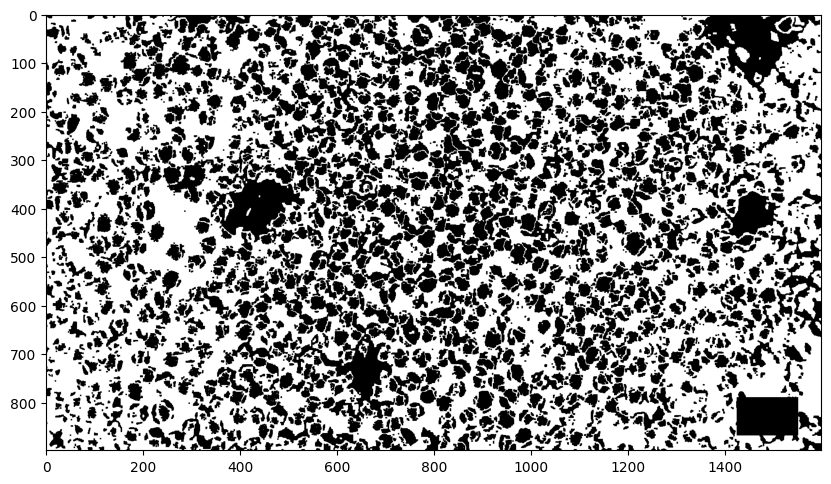

0 255


In [115]:
img_segmentation_no_label_pre = img_with_complete_bubbles_no_label + img_with_complete_fibers_no_label
img_segmentation_no_label_pre[img_segmentation_no_label_pre>255] = 255

img_segmentation_no_label = 255 - img_segmentation_no_label_pre

img_segmentation_no_label[mascara_etiqueta == 255] = 0

img_segmentation_no_label = np.uint8(img_segmentation_no_label)

fig = plt.figure(figsize=(10,10))
plt.imshow(img_segmentation_no_label,cmap='gray')
plt.show()

print(np.min(img_segmentation_no_label),np.max(img_segmentation_no_label))

In [136]:
pixeles_fibras = np.count_nonzero(img_with_complete_fibers_no_label)
pixeles_brubujas = np.count_nonzero(img_with_complete_bubbles_no_label)
pixeles_resina = np.count_nonzero(img_segmentation_no_label)
pixeles_etiqueta = np.count_nonzero(mascara_etiqueta)

list_pixeles = [pixeles_fibras,pixeles_brubujas,pixeles_resina]
elementos = ["fibra","burbuja","resina"]


total = np.shape(img_bch)[0]*np.shape(img_bch)[1]
print(pixeles_fibras,pixeles_brubujas,pixeles_resina)
print(pixeles_fibras+pixeles_brubujas+pixeles_resina+pixeles_etiqueta)
print(total)

porcentajes = []

for cantidad, elemento in zip(list_pixeles,elementos):
    porcentaje = 100*cantidad/total
    porcentajes.append(porcentaje)
    print(f"{elemento}: {porcentaje:.2f} %")

561847 52055 813566
1437501
1437501
fibra: 39.08 %
burbuja: 3.62 %
resina: 56.60 %


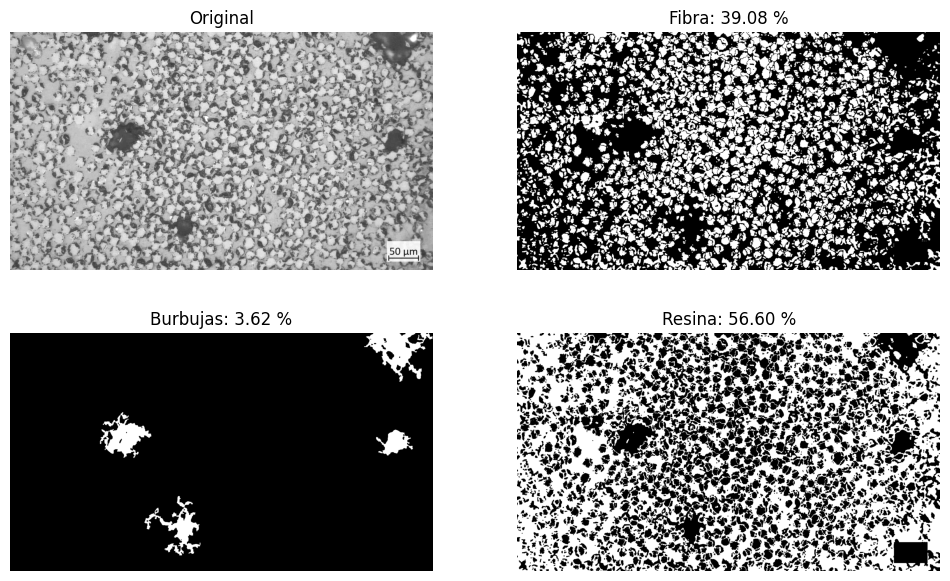

In [141]:
fig = plt.figure(figsize=(12,15))

ax = fig.add_subplot(4, 2, 1)
plt.imshow(img_bch,cmap='gray')
plt.title("Original")
plt.axis("off")

ax = fig.add_subplot(4, 2, 2)
plt.imshow(img_with_complete_fibers_no_label,cmap='gray')
plt.title(f"Fibra: {porcentajes[0]:.2f} %")
plt.axis("off")

ax = fig.add_subplot(4, 2, 3)
plt.imshow(img_with_complete_bubbles_no_label,cmap='gray')
plt.title(f"Burbujas: {porcentajes[1]:.2f} %")
plt.axis("off")

ax = fig.add_subplot(4, 2, 4)
plt.imshow(img_segmentation_no_label,cmap='gray')
plt.title(f"Resina: {porcentajes[2]:.2f} %")
plt.axis("off")

plt.show()